# Imports

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import xgboost as xgb
import numpy as np
import os
from pandas.plotting import scatter_matrix
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV

# EDA

### Load data to memory

In [2]:
base: str
if os.getcwd() == "/kaggle/working":
    base = "/kaggle"
else:
    base = os.getcwd()

def get_full_dir(sub_dir: str) -> str:
    return os.path.join(base, sub_dir)

In [3]:
print(os.getcwd())

C:\Users\kubaa\Documents\GitHub\ParisHousingPricePrediction\ParisHousingPricePrediction\src


In [4]:
df_train = pd.read_csv(get_full_dir('input/playground-series-s3e6/train.csv'), index_col='id')
df_test = pd.read_csv(get_full_dir('input/playground-series-s3e6/test.csv'), index_col='id')

### Check for null values

In [5]:
df_train.isna().sum()

squareMeters         0
numberOfRooms        0
hasYard              0
hasPool              0
floors               0
cityCode             0
cityPartRange        0
numPrevOwners        0
made                 0
isNewBuilt           0
hasStormProtector    0
basement             0
attic                0
garage               0
hasStorageRoom       0
hasGuestRoom         0
price                0
dtype: int64

###### The are no null values, we could lower dtype accury to save memory

In [6]:
df_train.head()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price
id,,,,,,,,,,,,,,,,,
0,34291,24,1,0,47,35693,2,1,2000,0,1,8,5196,369,0,3,3436795.2
1,95145,60,0,1,60,34773,1,4,2000,0,1,729,4496,277,0,6,9519958.0
2,92661,45,1,1,62,45457,4,8,2020,1,1,7473,8953,245,1,9,9276448.1
3,97184,99,0,0,59,15113,1,1,2000,0,1,6424,8522,256,1,9,9725732.2
4,61752,100,0,0,57,64245,8,4,2018,1,0,7151,2786,863,0,7,6181908.8


In [7]:
df_train.describe()

,squareMeters,numberOfRooms,hasYard,hasPool,floors,cityCode,cityPartRange,numPrevOwners,made,isNewBuilt,hasStormProtector,basement,attic,garage,hasStorageRoom,hasGuestRoom,price
count,2.273000e+04,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,22730.000000,2.273000e+04
mean,4.658622e+04,48.241091,0.475891,0.452750,47.305983,50013.795996,5.585042,5.620766,2008.005059,0.467972,0.460009,5283.646634,5067.981698,530.469644,0.461681,5.153058,4.634457e+06
std,4.952124e+04,28.226428,0.499429,0.497773,47.777207,30006.637729,2.739533,2.713026,118.826777,0.498984,0.498409,3047.084412,3097.347939,274.840604,0.498540,3.055246,2.925163e+06
min,8.900000e+01,1.000000,0.000000,0.000000,1.000000,3.000000,1.000000,1.000000,1990.000000,0.000000,0.000000,4.000000,1.000000,4.000000,0.000000,0.000000,1.031350e+04
25%,2.039275e+04,25.000000,0.000000,0.000000,25.000000,22936.000000,3.000000,3.000000,2000.000000,0.000000,0.000000,2977.250000,2599.000000,297.000000,0.000000,3.000000,2.041739e+06
50%,4.448400e+04,47.000000,0.000000,0.000000,45.000000,50414.000000,6.000000,6.000000,2006.000000,0.000000,0.000000,5359.000000,4977.000000,515.000000,0.000000,5.000000,4.450823e+06
75%,7.154700e+04,75.000000,1.000000,1.000000,69.000000,76291.000000,8.000000,8.000000,2014.000000,1.000000,1.000000,7746.000000,7652.000000,767.000000,1.000000,8.000000,7.159920e+06
max,6.071330e+06,100.000000,1.000000,1.000000,6000.000000,491100.000000,10.000000,10.000000,10000.000000,1.000000,1.000000,91992.000000,96381.000000,9017.000000,1.000000,10.000000,1.000428e+07


### Check for outliers and skwed distrubition

<function matplotlib.pyplot.show(close=None, block=None)>

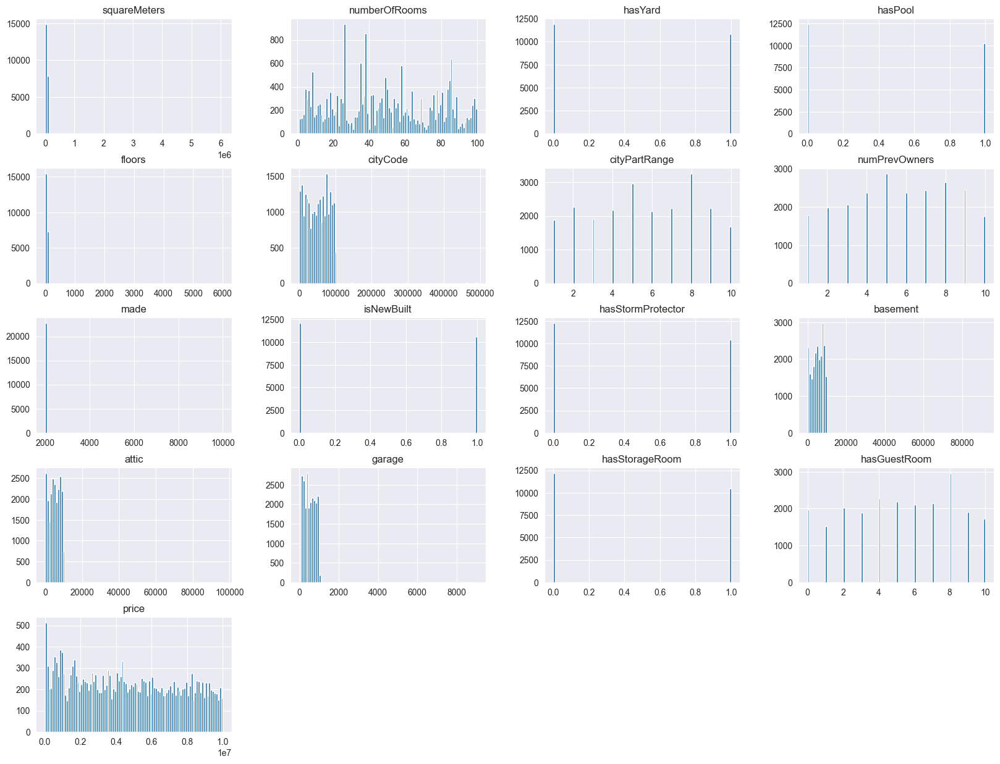

In [8]:
df_train.hist(bins=100, figsize=(20, 15))
plt.show

##### It appears that there are some outilers in ['attic', 'garage', 'made', 'basement', 'floors', 'cityCode', 'squareMeters'] columns, it could be due to some very large and expesive buliding (true outliers)

In [9]:
features_with_outliers = ['attic', 'garage', 'made', 'basement', 'floors', 'cityCode', 'squareMeters']

In [10]:
def remove_outliers(df):
    for c in features_with_outliers:
        if c == 'garage':
            first_percentile = df[c].quantile(0.001)
            df = df[df[c] > first_percentile]

        ninety_ninth_percentile = df[c].quantile(0.999)
        df = df[df[c] < ninety_ninth_percentile]
        #df_t = df_t[(df_t[c] > first_percentile) & (df_t[c] < ninety_ninth_percentile)]
    return df

In [11]:
print(f'Before: {len(df_train)}')
df_train = remove_outliers(df_train);
print(f'After: {len(df_train)}')

Before: 22730
After: 22153


<function matplotlib.pyplot.show(close=None, block=None)>

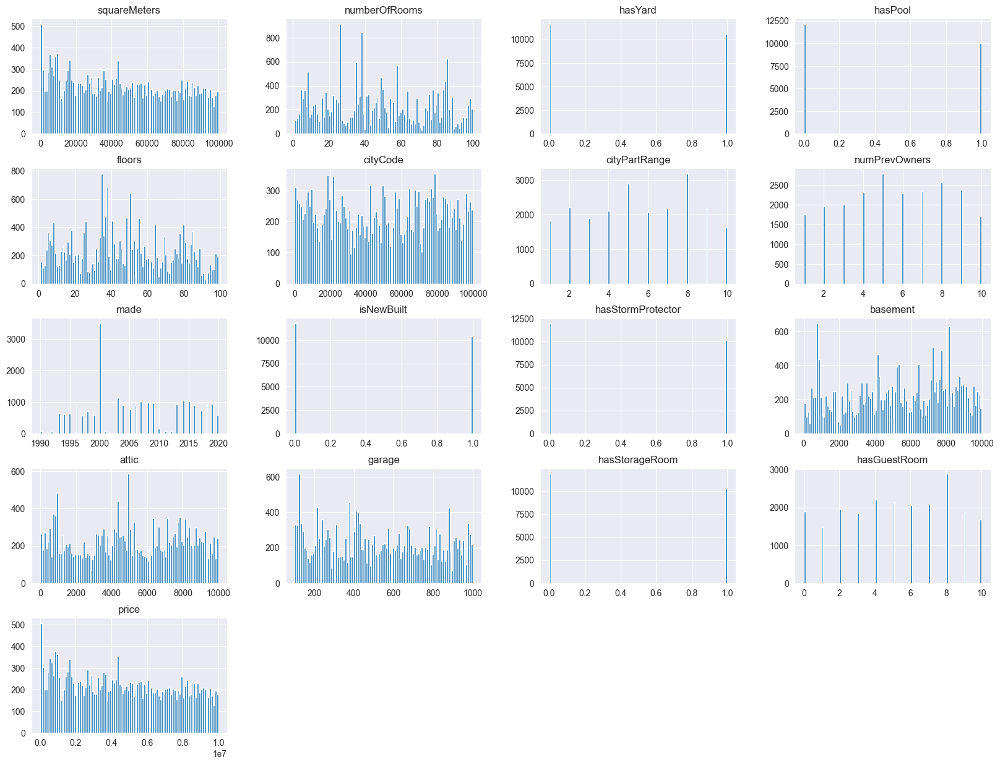

In [12]:
df_train.hist(bins=100, figsize=(20, 15))
plt.show

In [13]:
intresting_features = ['squareMeters', 'numberOfRooms', 'floors', 'price']
axes = pd.plotting.scatter_matrix(df_train[intresting_features], figsize=(120, 80))
[ax.xaxis.label.set_size(100) for ax in axes.ravel()]
[ax.yaxis.label.set_size(100) for ax in axes.ravel()]
plt.show()
plt.savefig(r"figure_1.png") # the figer stoped saving correctly

<Figure size 640x480 with 0 Axes>

##### There seems to be very strong corrletion between price and squareMeters, after close inspaction (on the donwloaded and zoomed in image) it can be seen that there are couple of outliers that do not fit the base price/squareMeters colerlation

# Data pipeline

In [14]:
features_for_normaliztion = ['squareMeters',
                             'basement',
                             'attic',
                             'garage',
                             'floors',
                             'made', 
                            ]
features_for_onehot_encoding  = ['hasStorageRoom',
                         'hasStormProtector',
                         'hasGuestRoom',
                         'isNewBuilt',
                         'hasYard',
                         'hasPool',
                        ]
features_for_ordinal_encoding  = ['cityPartRange',
                        'numPrevOwners',
                        'numberOfRooms',
                        ]

In [15]:
def get_full_pipeline():
    preprocessor  = ColumnTransformer([ 
        ("num", StandardScaler(), features_for_normaliztion),
        ("cat_lable_encoder", OrdinalEncoder(), features_for_ordinal_encoding)
        ("cat_one_hot", OneHotEncoder(), features_for_onehot_encoding), 
    ])
    full_pipeline = Pipeline([
        ('preprocessor', preprocessor),
        ('classifier', xgb.XGBRegressor()),
    ])
    return full_pipeline

<>:4: SyntaxWarning: 'tuple' object is not callable; perhaps you missed a comma?
<>:4: SyntaxWarning: 'tuple' object is not callable; perhaps you missed a comma?
C:\Users\kubaa\AppData\Local\Temp\ipykernel_19188\923656637.py:4: SyntaxWarning: 'tuple' object is not callable; perhaps you missed a comma?
  ("cat_lable_encoder", OrdinalEncoder(), features_for_ordinal_encoding)


In [16]:
class CustomePipeline():
    
    def __init__(self):
        self.preprocessor =  ColumnTransformer([ 
            ("num", StandardScaler(), features_for_normaliztion), 
            ("cat_ordinal_encoder", OrdinalEncoder(), features_for_ordinal_encoding),
            ("cat_one_hot", OneHotEncoder(), features_for_onehot_encoding),
        ])
        self.model = xgb.XGBRegressor(n_estimators=100000, 
                                      learning_rate=0.1, 
                                      objective='reg:squarederror',
                                      early_stopping_rounds=5,
                                      reg_alpha = 1,
                                      reg_lambda = 1
                                     )
        #self.model = xgb.XGBRegressor(max_depth=3, learning_rate=0.24 , n_estimators=800, objective='reg:squarederror', booster='gbtree')
        self.target_preprocessor = StandardScaler()
    
    def _add_features(self, X):
        X['squareMetersPerRoom'] = X['squareMeters'] / X['numberOfRooms']
        if 'squareMetersPerRoom' not in features_for_normaliztion:
            features_for_normaliztion.append('squareMetersPerRoom')
        
    def fit(self, X, y, X_eval, y_eval):
        self._add_features(X)
        self._add_features(X_eval)
        
        X = self.preprocessor.fit_transform(X)
        X_val = self.preprocessor.transform(X_eval)
        
        y = self.target_preprocessor.fit_transform(y.to_numpy().reshape(-1, 1))
        y_val = self.target_preprocessor.transform(y_eval.to_numpy().reshape(-1, 1))
        
        self.model.fit(X, y, eval_set=[(X_val, y_val)], verbose=False)
        
    def predict(self, X):
        self._add_features(X)
        X = self.preprocessor.transform(X)
        y_pred = self.model.predict(X)
        y_pred = self.target_preprocessor.inverse_transform(y_pred.reshape(-1, 1))
        return y_pred
    
    def grid_search(self, X, y, X_eval, y_eval):
        # Processes the data
        X = self.preprocessor.fit_transform(X)
        X_val = self.preprocessor.transform(X_eval)
    
        y = self.target_preprocessor.fit_transform(y.to_numpy().reshape(-1, 1))
        y_val = self.target_preprocessor.transform(y_eval.to_numpy().reshape(-1, 1))
        
        # Define the hyperparameters and their possible values
        param_grid = {
            'n_estimators': [10, 100, 1000],
            'max_depth': [3, 7, 11],
            'learning_rate':[0.1, 0.2], 
            'subsample': [1, 10],
            'reg_lambda': [0, 1, 2],
            'reg_alpha': [0, 1, 2],
            'objective':['reg:squarederror'],
            'early_stopping_rounds':[5],
            'tree_method':["gpu_hist"]
        }

        # Create an XGBoost model and wrap it in a GridSearchCV object
        xgb_model = xgb.XGBRegressor()
        grid_search = GridSearchCV(estimator=xgb_model, param_grid=param_grid, cv=5)

        # Train the GridSearchCV object with early stopping
        grid_search.fit(X, y_train, eval_set=[(X_val, y_val)], verbose=False)
        
        print(grid_search.best_params_)

# Hyperparamiter search

In [17]:
#df_train = pd.read_csv('/kaggle/input/playground-series-s3e6/train.csv', index_col='id').drop('cityCode', axis=1)
#X = df_train.drop('price', axis=1)
#y = df_train['price']
#X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=0)
#CustomePipeline().grid_search(X_train, y_train, X_val, y_val)

# Trains the model

In [18]:
df_train = pd.read_csv(get_full_dir('input/playground-series-s3e6/train.csv'), index_col='id')
X = df_train.drop(['price', 'cityCode'], axis=1)
y = df_train['price']
SKFs = KFold(n_splits=5, shuffle=True, random_state=1)
losses = []
pipelines = []
for fold, (idx_tr, idx_vl) in enumerate(SKFs.split(X, y)):
    # splits data to dev/train sets and removes outliers from train data
    train_dataframe = remove_outliers(df_train.iloc[idx_tr])
    dev_dataframe = df_train.iloc[idx_vl]
    
    # splits data to features and target
    X_train = train_dataframe.drop('price', axis=1)
    y_train = train_dataframe['price']
    X_dev = dev_dataframe.drop('price', axis=1)
    y_dev = dev_dataframe['price']
    
    # crates and fits a pipeline
    pipelineMy = CustomePipeline()
    pipelineMy.fit(X_train, y_train, X_dev, y_dev)
    
    # evaluates the model
    pipelines.append(pipelineMy)
    loss = mean_squared_error(y_dev, pipelineMy.predict(X_dev), squared=False)
    losses.append(loss)
    print(f'Fold {fold} loss: {loss}')
print(f'Mean loss: {np.array(losses).mean()}')

Fold 0 loss: 181100.99149555218
Fold 1 loss: 153377.1933010824
Fold 2 loss: 162273.2777987161
Fold 3 loss: 178603.1794581274
Fold 4 loss: 187322.49491267666
Mean loss: 172535.42739323093


# Makes submisson

In [19]:
def make_predictions(pipelines, data):
    prediction = []
    for pipeline in pipelines:
        prediction.append(pipeline.predict(data))
    return np.array(prediction).mean(axis = 0).ravel()

In [20]:
finale_predictions = make_predictions(pipelines, df_test)

In [21]:
submissions = pd.DataFrame({"id": list(range(22730, 22730 + len(finale_predictions))), "price": finale_predictions})

In [22]:
pd.DataFrame(submissions).to_csv("submission.csv", index=False, header=True)